In [1]:
import scanpy as sc
import pandas as pd
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')


scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.20.0 scipy==1.10.0 pandas==1.3.4 scikit-learn==0.24.2 statsmodels==0.12.2 python-igraph==0.10.3 pynndescent==0.5.6


In [2]:
l = sc.read_mtx("chimp_cell_counts_consensus.mtx")

In [3]:
p = pd.read_csv("metadata_chimp_cells.tsv", sep = "\t")
g = pd.read_csv("genes_consensus.txt", sep = "\t", header = None)
l.var = p
l.obs = g

In [4]:
l.obs.index = l.obs[1]

In [5]:
l = l.transpose()

C:\Users\Alex\Anaconda3\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [6]:
l.var[1] = l.var[1].astype(str)
l.var.columns = ["ENS", "Gene"]
l.var.index = l.var["Gene"]
l.var.index

Index(['MIR1302-2HG', 'FAM138A', 'OR4F5', 'AL627309.1', 'AL627309.3',
       'AL627309.2', 'AL627309.4', 'AL732372.1', 'OR4F29', 'AC114498.1',
       ...
       'MT-CO2', 'MT-ATP8', 'MT-ATP6', 'MT-CO3', 'MT-ND3', 'MT-ND4L', 'MT-ND4',
       'MT-ND5', 'MT-ND6', 'MT-CYB'],
      dtype='object', name='Gene', length=32856)

In [7]:
l.var_names_make_unique()

In [8]:
hum_counts = sc.read_mtx("human_cell_counts_consensus.mtx")

normalizing counts per cell
    finished (0:00:05)


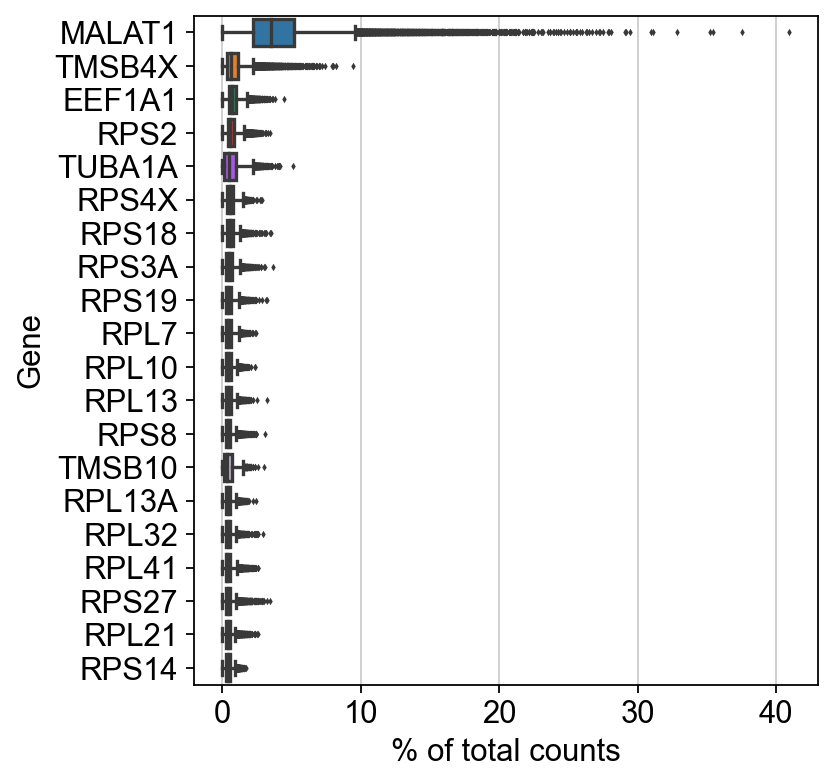

In [9]:
p = pd.read_csv("metadata_human_cells.tsv", sep = "\t")
g = pd.read_csv("genes_consensus.txt", sep = "\t", header = None)
hum_counts.var = p
hum_counts.obs = g
hum_counts.obs.index = hum_counts.obs[1]
hum_counts = hum_counts.transpose()
sc.pl.highest_expr_genes(l, n_top=20, )

In [10]:
hum_counts.var[1] = hum_counts.var[1].astype(str)
hum_counts.var.columns = ["ENS", "Gene"]
hum_counts.var.index = hum_counts.var["Gene"]
hum_counts.var_names_make_unique()

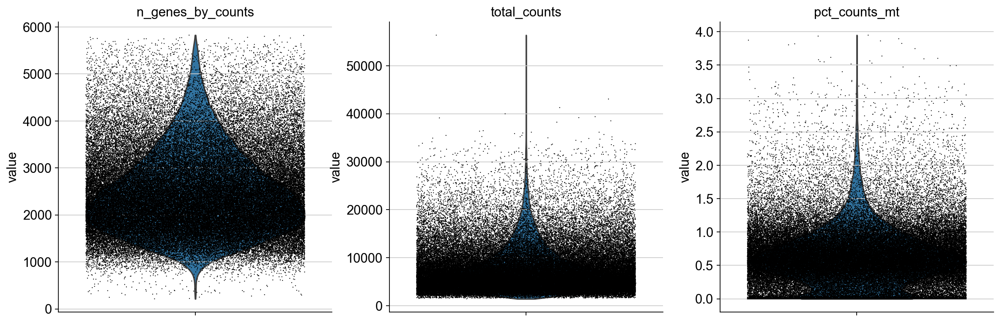

C:\Users\Alex\Anaconda3\lib\site-packages\scanpy\preprocessing\_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number


filtered out 9214 genes that are detected in less than 3 cells
filtered out 10040 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.ob

In [11]:
hum_counts.var['mt'] = hum_counts.var_names.str.contains('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(hum_counts, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
l.var['mt'] = l.var_names.str.contains('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(l, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(hum_counts, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)
hum_counts = hum_counts[hum_counts.obs.n_genes_by_counts < 2500, :]
hum_counts = hum_counts[hum_counts.obs.pct_counts_mt < 5, :]
l = l[l.obs.n_genes_by_counts < 2500, :]
l = l[l.obs.pct_counts_mt < 5, :]
sc.pp.filter_cells(hum_counts, min_genes=200)
sc.pp.filter_genes(hum_counts, min_cells=3)
sc.pp.filter_cells(l, min_genes=200)
sc.pp.filter_genes(l, min_cells=3)
sc.pp.normalize_total(hum_counts, target_sum=1e6)
sc.pp.normalize_total(l, target_sum=1e6)
sc.pp.log1p(hum_counts)
sc.pp.log1p(l)
sc.pp.highly_variable_genes(hum_counts, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pp.highly_variable_genes(l, min_mean=0.0125, max_mean=3, min_disp=0.5)
hum_counts.raw = hum_counts
l.raw = l
sc.tl.pca(hum_counts, svd_solver='arpack')
sc.tl.pca(l, svd_solver='arpack')
sc.pp.neighbors(hum_counts, n_neighbors=10, n_pcs=40)
sc.pp.neighbors(l, n_neighbors=10, n_pcs=40)
sc.tl.umap(hum_counts)
sc.tl.umap(l)

In [15]:
hcv = hum_counts[hum_counts.obs["cl_FullLineage"].isin(["ventral progenitors and neurons 1", "ventral progenitors and neurons 2", "ventral progenitors and neurons 3"])]
ccv = l[l.obs["cl_FullLineage"].isin(["ventral forebrain progenitors and neurons"])]
v = hcv.concatenate(ccv)

C:\Users\Alex\Anaconda3\lib\site-packages\anndata\_core\anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


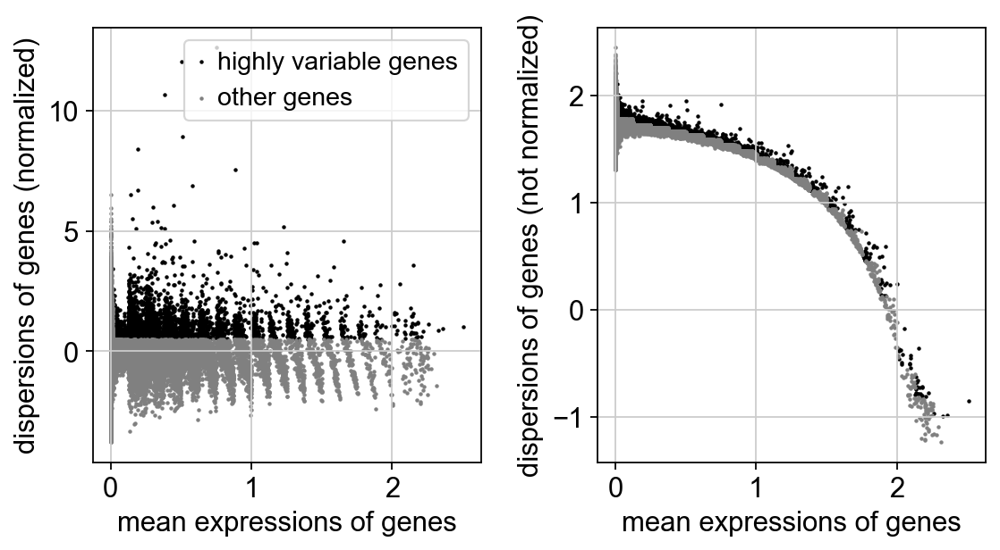

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


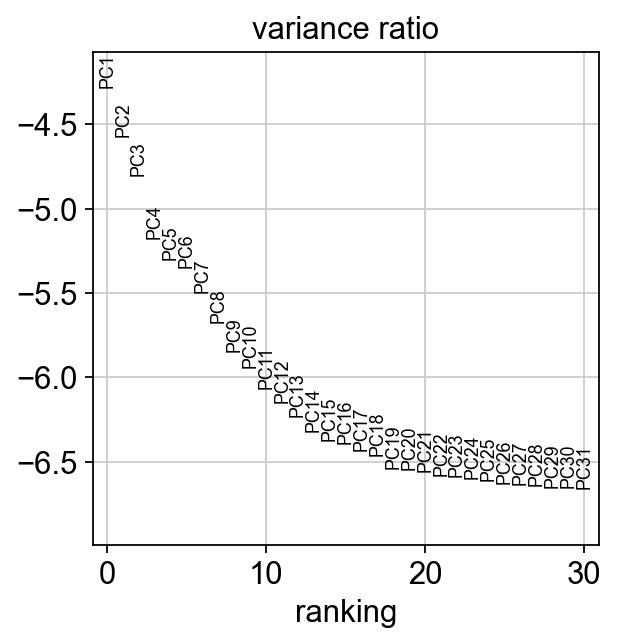

2023-03-13 11:41:20,724 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-03-13 11:41:24,884 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-03-13 11:41:24,955 - harmonypy - INFO - Iteration 1 of 20
2023-03-13 11:41:27,222 - harmonypy - INFO - Iteration 2 of 20
2023-03-13 11:41:29,723 - harmonypy - INFO - Converged after 2 iterations


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [53]:
sc.pp.normalize_total(v, target_sum=1e4)
sc.pp.log1p(v)
sc.pp.highly_variable_genes(v, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(v)
sc.tl.pca(v, svd_solver='arpack')
sc.pl.pca_variance_ratio(v, log=True)
import scanpy.external as sce
sce.pp.harmony_integrate(v, key = 'Species', basis = "X_pca", max_iter_harmony = 20)
sc.pp.neighbors(v, n_neighbors=10, n_pcs=40, use_rep = "X_pca_harmony")


normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


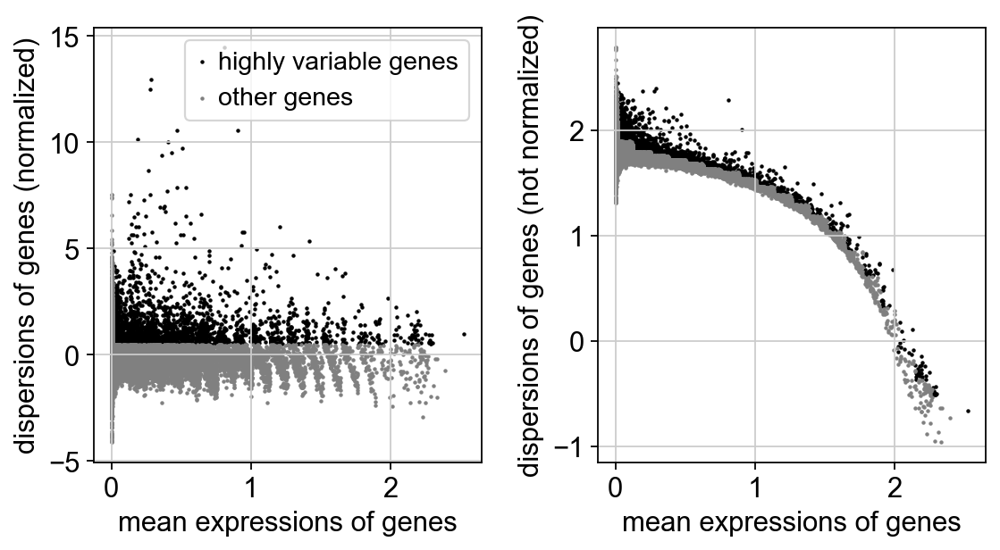

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


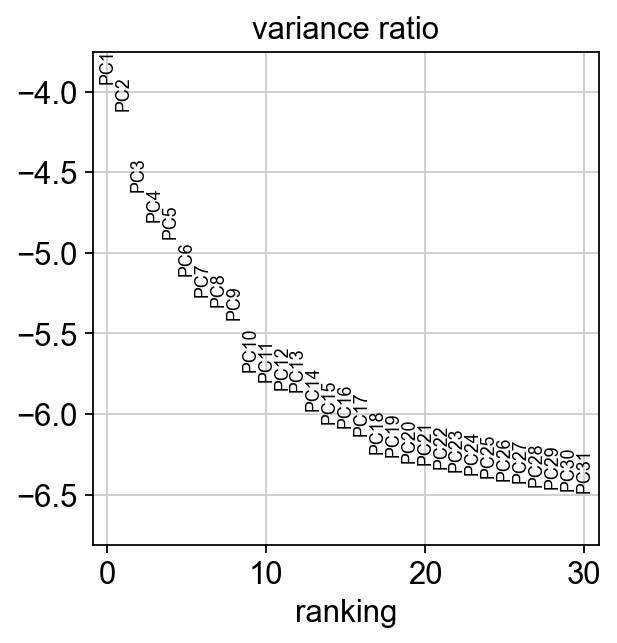

2023-02-11 14:31:29,394 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-02-11 14:31:33,833 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-02-11 14:31:33,911 - harmonypy - INFO - Iteration 1 of 20
2023-02-11 14:31:36,436 - harmonypy - INFO - Iteration 2 of 20
2023-02-11 14:31:38,985 - harmonypy - INFO - Converged after 2 iterations


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [18]:
sc.pp.normalize_total(vm, target_sum=1e4)
sc.pp.log1p(vm)
sc.pp.highly_variable_genes(vm, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(vm)
sc.tl.pca(vm, svd_solver='arpack')
sc.pl.pca_variance_ratio(vm, log=True)
import scanpy.external as sce
sce.pp.harmony_integrate(vm, key = 'Species', basis = "X_pca", max_iter_harmony = 20)
sc.pp.neighbors(vm, n_neighbors=10, n_pcs=40, use_rep = "X_pca_harmony")


running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)


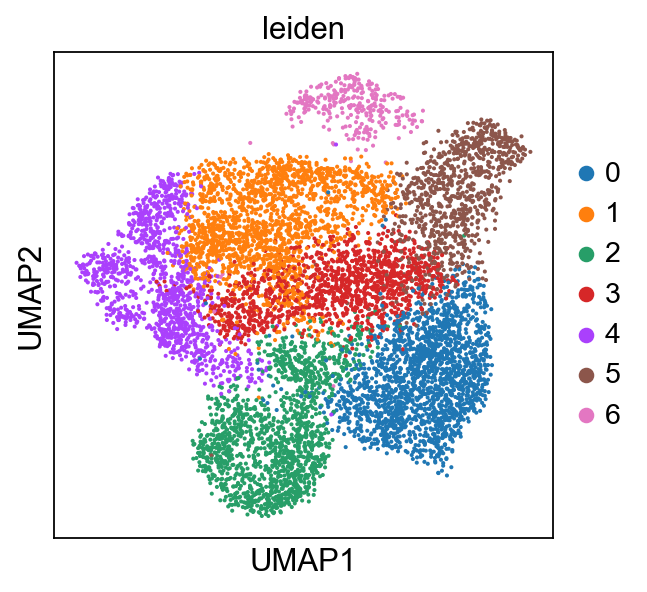

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:13)


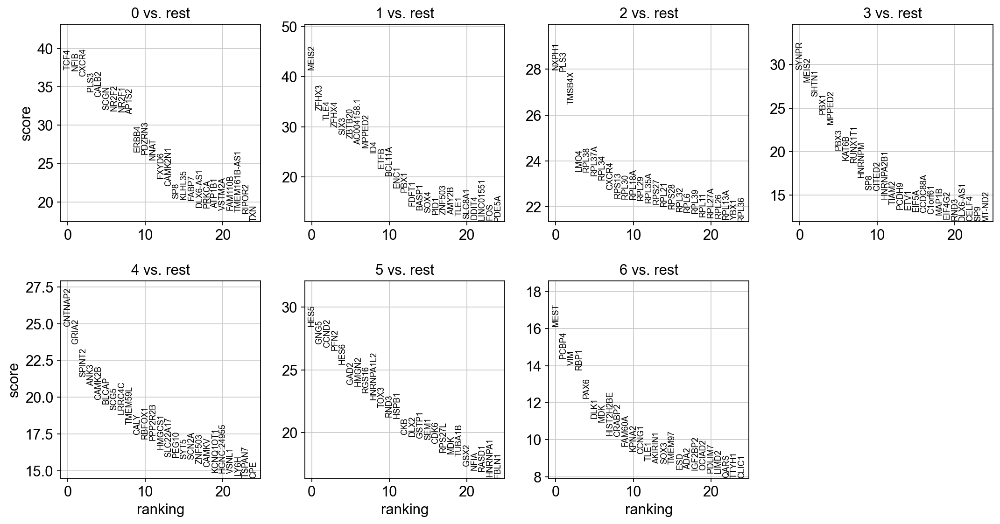

In [54]:
sc.tl.leiden(v, resolution=0.5)
sc.tl.umap(v)
sc.pl.umap(v, color=['leiden'])
x = sc.tl.rank_genes_groups(v, 'leiden', method='wilcoxon', use_raw = False)
sc.pl.rank_genes_groups(v, n_genes=25, sharey=False)

running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


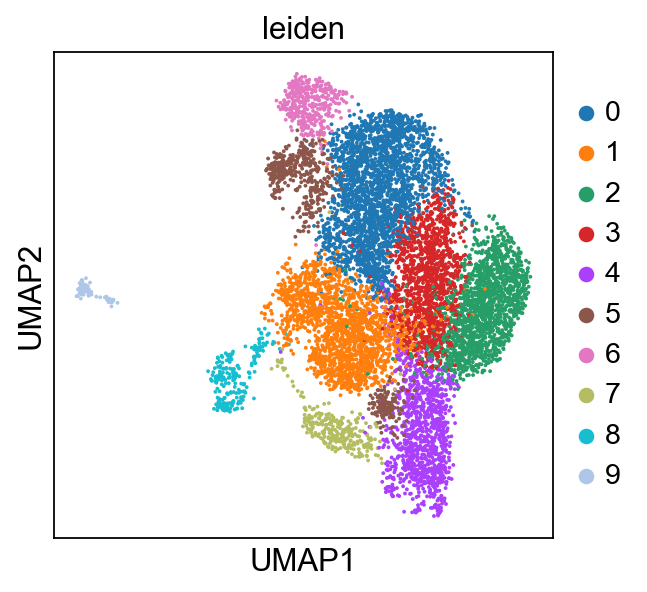

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:12)


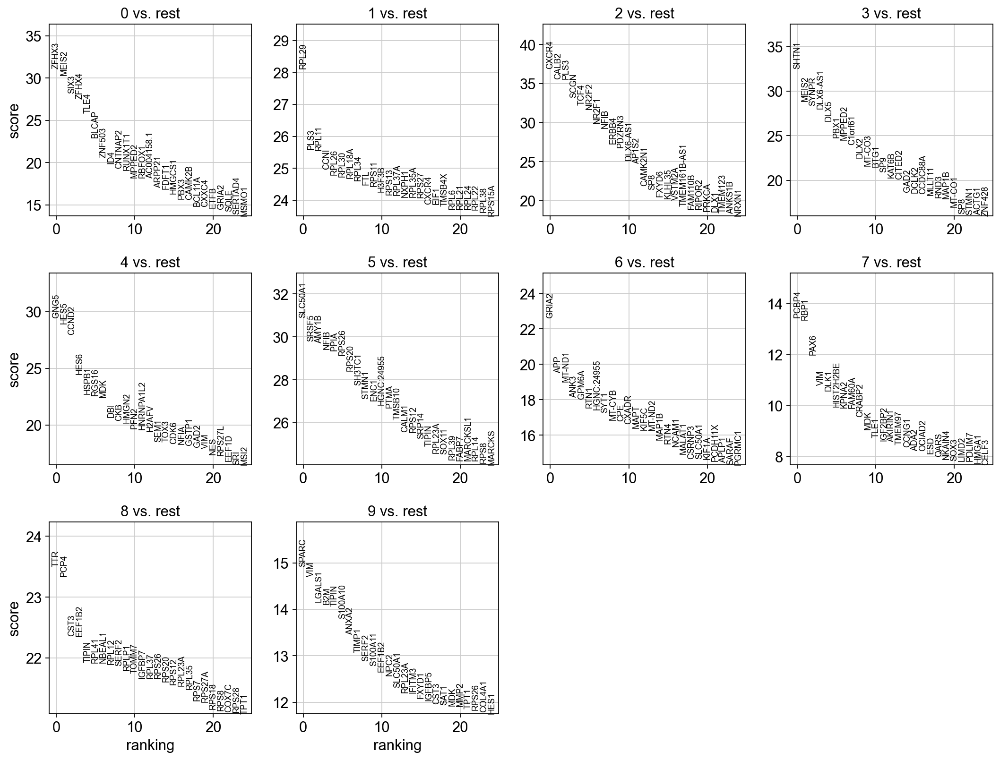

In [20]:
sc.tl.leiden(vm, resolution=0.5)
sc.tl.umap(vm)
sc.pl.umap(vm, color=['leiden'])
x = sc.tl.rank_genes_groups(vm, 'leiden', method='wilcoxon', use_raw = False)
sc.pl.rank_genes_groups(vm, n_genes=25, sharey=False)

In [25]:
v_prog = v[v.obs["leiden"].isin(["5"])]

View of AnnData object with n_obs × n_vars = 854 × 21884
    obs: 'Species', 'Stage', 'Line', 'Sample', 'Barcode', 'PredCellType', 'nGene', 'nUMI', 'PercentMito', 'in_FullLineage', 'in_LineComp', 'in_DE', 'pseudocellIdx_FullLineage', 'pseudocellIdx_LineComp', 'pseudocellIdx_DE', 'cl_FullLineage', 'cl_LineComp', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'batch', 'leiden'
    var: 'ENS', 'mt', 'Gene-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'Gene-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap', 'X_pca_harmony

running Leiden clustering
    finished: found 4 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP


C:\Users\Alex\Anaconda3\lib\site-packages\scanpy\tools\_leiden.py:158: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added] = pd.Categorical(


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


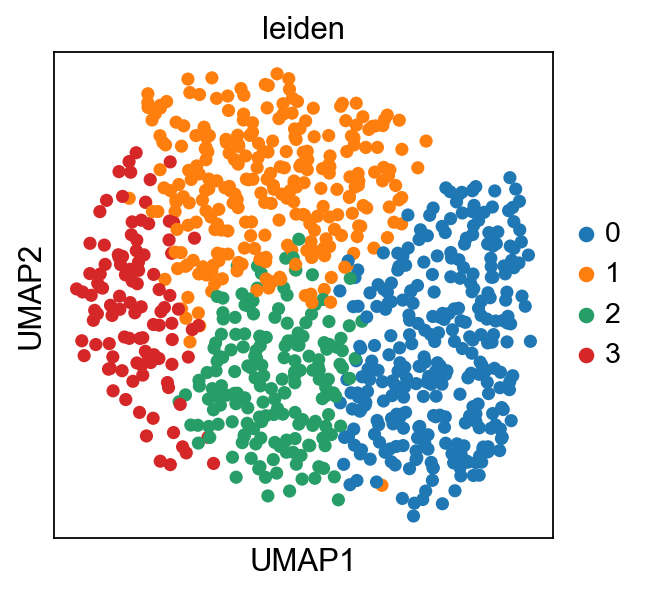

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


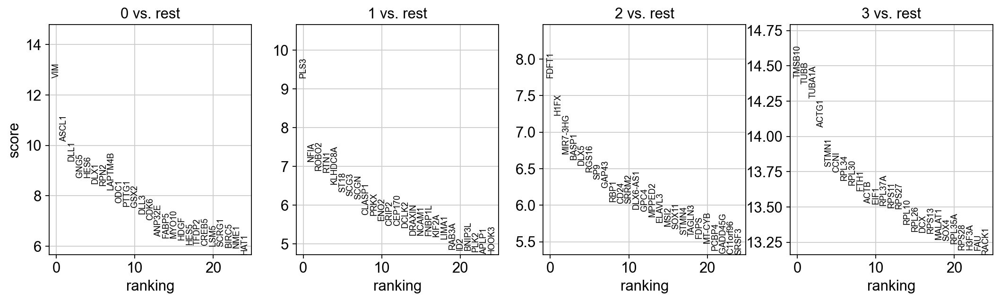

In [26]:
#No clear progenitor subpopulations
sc.tl.leiden(v_prog, resolution=0.5)
sc.tl.umap(v_prog)
sc.pl.umap(v_prog, color=['leiden'])
x = sc.tl.rank_genes_groups(v_prog, 'leiden', method='wilcoxon', use_raw = False)
sc.pl.rank_genes_groups(v_prog, n_genes=25, sharey=False)

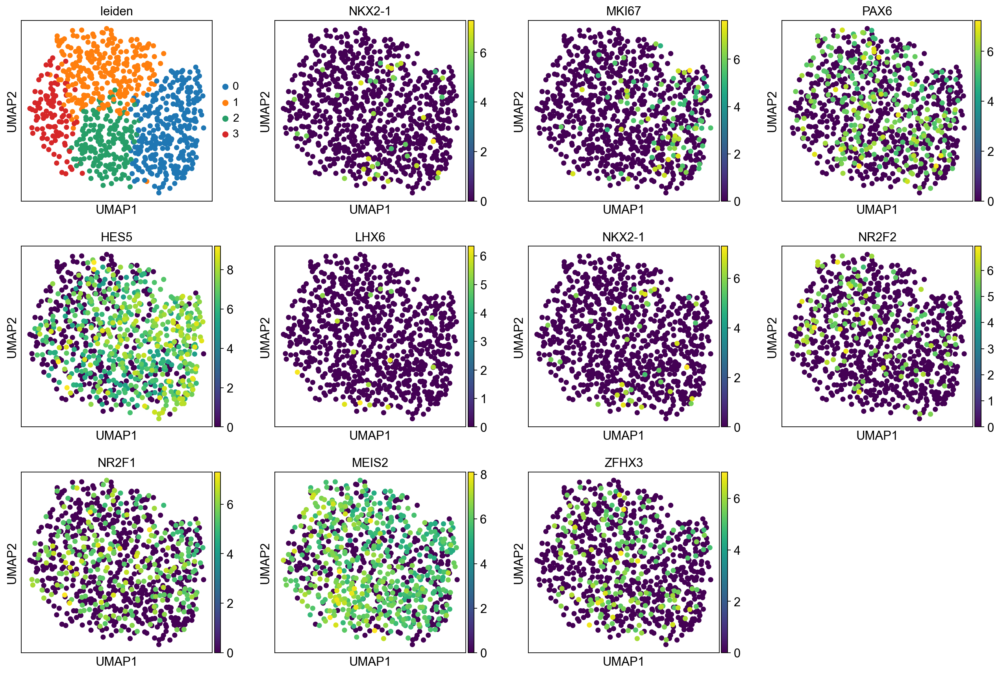

In [27]:
#Generally just reflects maturation state, we will use all the progenitors as the base for each tree
sc.pl.umap(v_prog, color = ["leiden", "NKX2-1", "MKI67", "PAX6", "HES5", "LHX6", "NKX2-1", "NR2F2", "NR2F1", "MEIS2", "ZFHX3"])

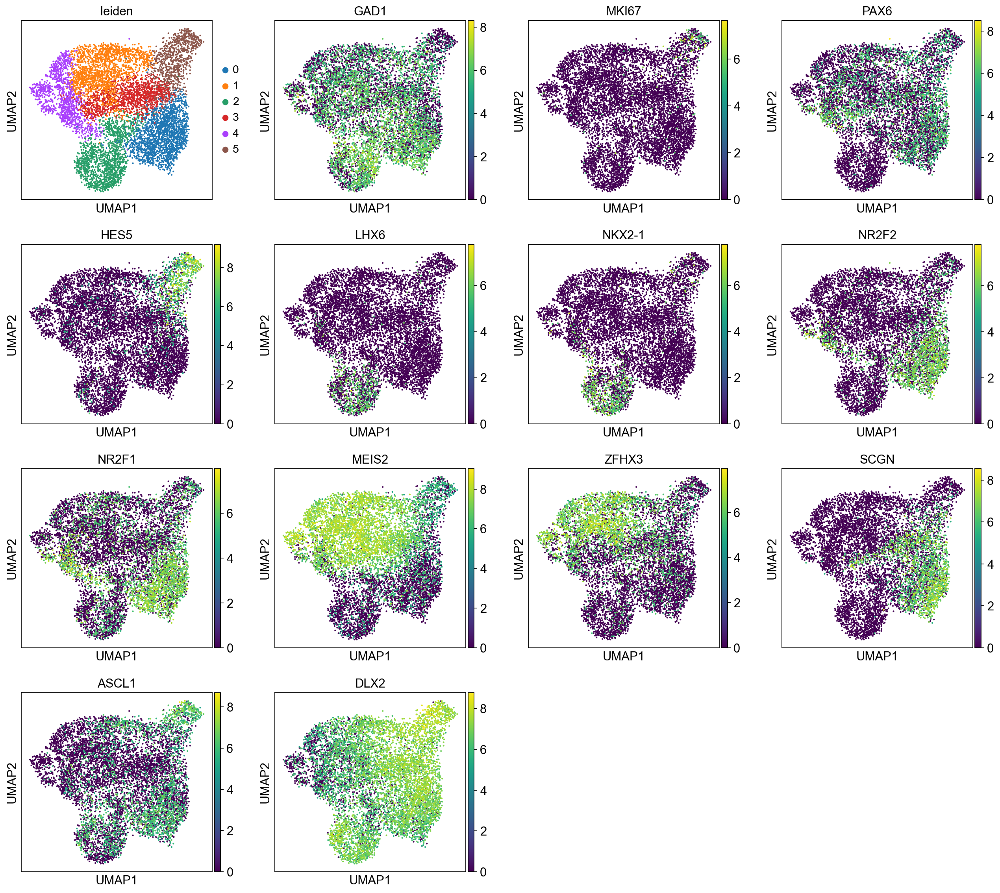

In [73]:
#0 NR2F2 + GAD1 SCGN = CGE
#1 LHX6 + NKX2-1 = MGE
#2, 3, 4, 6 MEIS2 + ZFHX3 = LGE
#5 MKI67 + HES5 = Progenitors, generally not distinguishable
v = v[~v.obs["leiden"].isin(["6"])]
sc.pl.umap(v, color = ["leiden", "GAD1", "MKI67", "PAX6", "HES5", "LHX6", "NKX2-1", "NR2F2", "NR2F1", "MEIS2", "ZFHX3", "SCGN", "ASCL1", "DLX2"])

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


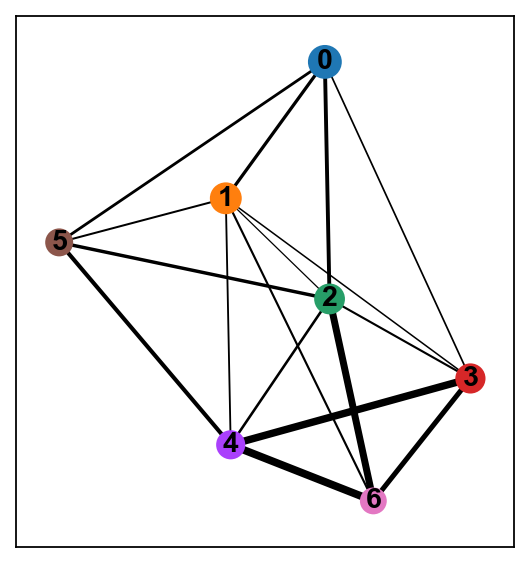

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fr', graph_drawing coordinates (adata.obsm) (0:00:55)


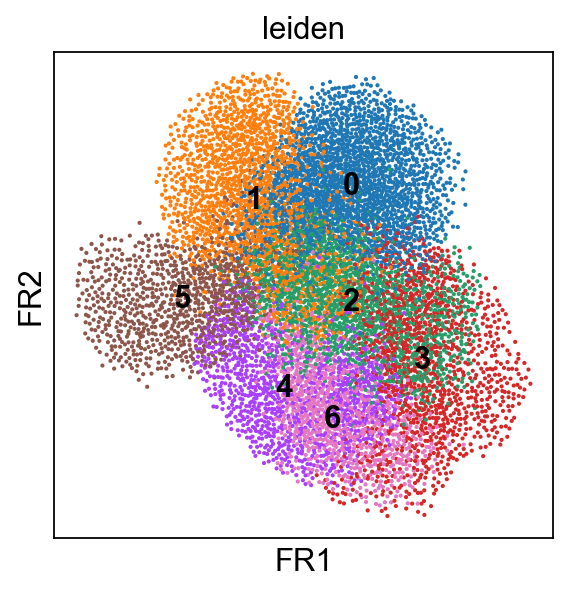

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


C:\Users\Alex\Anaconda3\lib\site-packages\anndata\compat\_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


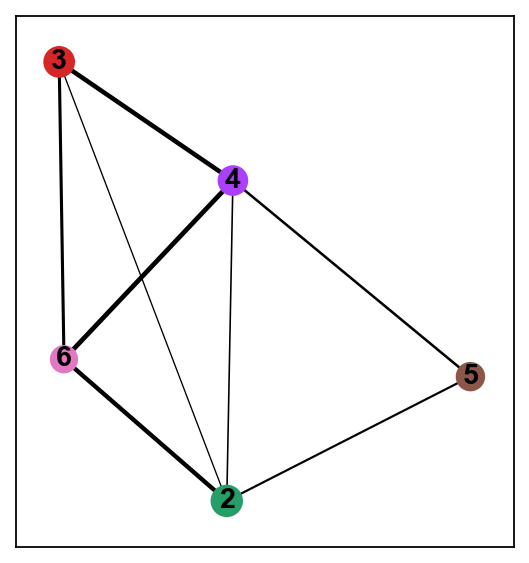

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fr', graph_drawing coordinates (adata.obsm) (0:00:17)


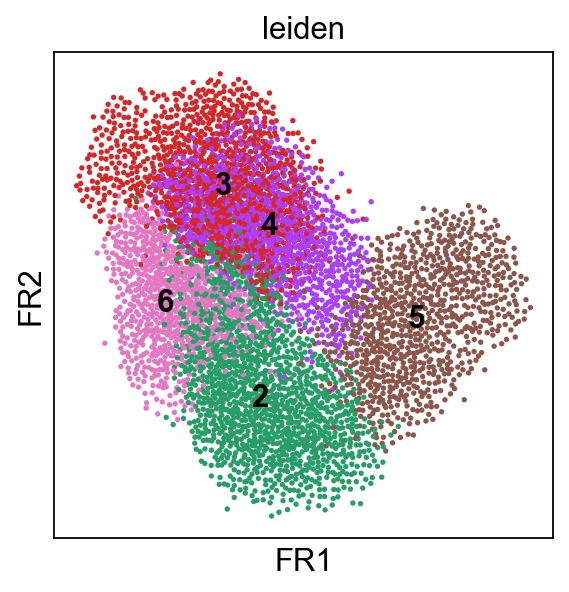

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


C:\Users\Alex\Anaconda3\lib\site-packages\anndata\compat\_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


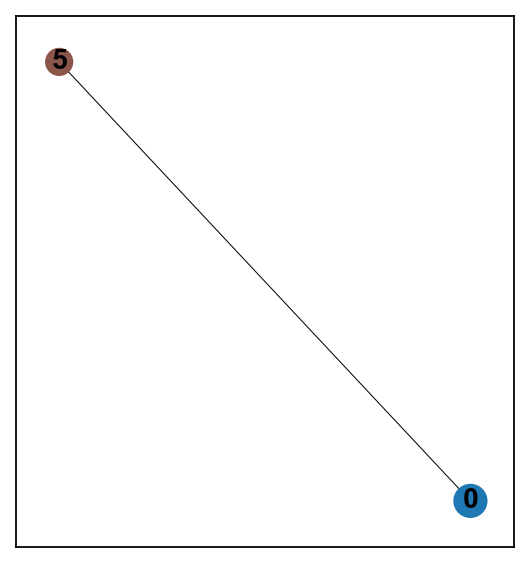

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fr', graph_drawing coordinates (adata.obsm) (0:00:06)


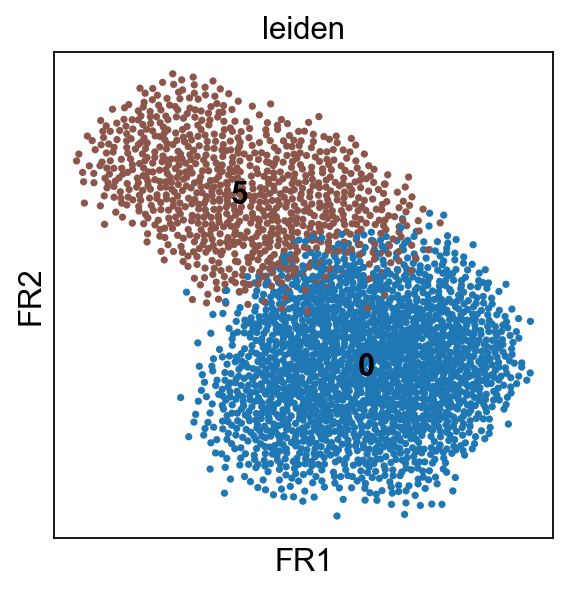

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


C:\Users\Alex\Anaconda3\lib\site-packages\anndata\compat\_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


TypeError: sparse matrix length is ambiguous; use getnnz() or shape[0]

In [33]:
import numpy as np
v_lge = v[v.obs["leiden"].isin(["2", "3", "4", "5", "6"])]
v_cge = v[v.obs["leiden"].isin(["0", "5"])]
v_mge = v[v.obs["leiden"].isin(["1", "5"])]

sc.tl.paga(v, groups='leiden')
sc.pl.paga(v, threshold=0.05, color=['leiden'])
sc.tl.draw_graph(v, init_pos='paga')
sc.pl.draw_graph(v, color=['leiden'], legend_loc='on data')

sc.tl.paga(v_lge, groups='leiden')
sc.pl.paga(v_lge, threshold=0.05, color=['leiden'])
sc.tl.draw_graph(v_lge, init_pos='paga')
sc.pl.draw_graph(v_lge, color=['leiden'], legend_loc='on data')

sc.tl.paga(v_cge, groups='leiden')
sc.pl.paga(v_cge, threshold=0.05, color=['leiden'])
sc.tl.draw_graph(v_cge, init_pos='paga')
sc.pl.draw_graph(v_cge, color=['leiden'], legend_loc='on data')

sc.tl.paga(v_mge, groups='leiden')
sc.pl.paga(v_mge, threshold=0.05, color=['leiden'])
sc.tl.draw_graph(v_mge, init_pos='paga')
sc.pl.draw_graph(v_mge, color=['leiden'], legend_loc='on data')


computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9779917  0.9693422  0.95260626 0.946058   0.9348307
     0.92741245 0.91613793 0.9036308  0.9005206  0.8907455  0.88492733
     0.8810847  0.87381905 0.8704289 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.98359704 0.9373225  0.9082613  0.8926061  0.8866245
     0.88045657 0.8606571  0.859371   0.85324126 0.8475809  0.8448588
     0.84169036 0.83944464 0.83803207]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of 

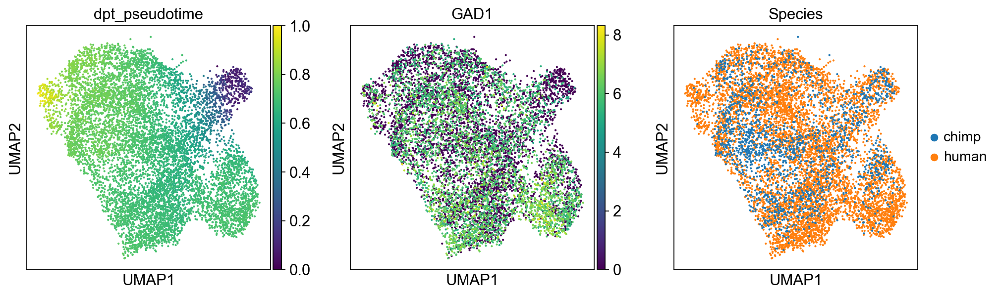

In [39]:
import numpy as np
v.uns['iroot'] = np.flatnonzero(v.obs["leiden"] == '5')[0]
v_cge.uns['iroot'] = np.flatnonzero(v_cge.obs["leiden"] == '5')[0]
v_lge.uns['iroot'] = np.flatnonzero(v_lge.obs["leiden"] == '5')[0]
v_mge.uns['iroot'] = np.flatnonzero(v_mge.obs["leiden"] == '5')[0]
sc.tl.dpt(v)
sc.tl.dpt(v_cge)
sc.tl.dpt(v_mge)
sc.tl.dpt(v_lge)
sc.pl.umap(v, color = ["dpt_pseudotime", "GAD1", "Species"])

In [47]:
vh5 = v.T[v.T.obs.index.isin(["GAD1"])]
vh5 = vh5.copy().T
z = pd.DataFrame(vh5.X.todense())
z.index = vh5.obs.index
z = z.sort_values(0)
z["Pseudotime"] = v.obs["dpt_pseudotime"]
z["UMAP1"] = [x[0] for x in list(v.obsm["X_umap"])]
z["UMAP2"] = [x[1] for x in list(v.obsm["X_umap"])]
z.to_csv("All_Interneurons_Pseudo.txt", sep = "\t")

In [49]:
sc.tl.umap()
vh5 = v_mge.T[v_mge.T.obs.index.isin(["GAD1"])]
vh5 = vh5.copy().T
z = pd.DataFrame(vh5.X.todense())
z.index = vh5.obs.index
z = z.sort_values(0)
z["Pseudotime"] = v_mge.obs["dpt_pseudotime"]
z["UMAP1"] = [x[0] for x in list(v_mge.obsm["X_umap"])]
z["UMAP2"] = [x[1] for x in list(v_mge.obsm["X_umap"])]
z.to_csv("MGE_Interneurons_Pseudo.txt", sep = "\t")

In [50]:
vh5 = v_lge.T[v_lge.T.obs.index.isin(["GAD1"])]
vh5 = vh5.copy().T
z = pd.DataFrame(vh5.X.todense())
z.index = vh5.obs.index
z = z.sort_values(0)
z["Pseudotime"] = v_lge.obs["dpt_pseudotime"]
z["UMAP1"] = [x[0] for x in list(v_lge.obsm["X_umap"])]
z["UMAP2"] = [x[1] for x in list(v_lge.obsm["X_umap"])]
z.to_csv("LGE_Interneurons_Pseudo.txt", sep = "\t")

In [51]:
vh5 = v_cge.T[v_cge.T.obs.index.isin(["GAD1"])]
vh5 = vh5.copy().T
z = pd.DataFrame(vh5.X.todense())
z.index = vh5.obs.index
z = z.sort_values(0)
z["Pseudotime"] = v_cge.obs["dpt_pseudotime"]
z["UMAP1"] = [x[0] for x in list(v_cge.obsm["X_umap"])]
z["UMAP2"] = [x[1] for x in list(v_cge.obsm["X_umap"])]
z.to_csv("CGE_Interneurons_Pseudo.txt", sep = "\t")